# Import Libraries 

In [288]:

from sklearn import datasets
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import mean_squared_error, make_scorer, fbeta_score, confusion_matrix, classification_report

from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import  PCA
from sklearn.preprocessing import StandardScaler
import numpy as np
import xgboost as xgb

import seaborn as sns
import matplotlib.pyplot as plt

In [289]:

import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

In [290]:
load_breast_cancer = datasets.load_breast_cancer()

In [291]:
print(load_breast_cancer['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [292]:
X = pd.DataFrame(load_breast_cancer.data, columns= load_breast_cancer.feature_names)
y =  pd.DataFrame(load_breast_cancer.target, columns= ['infected'])

In [293]:
df = pd.concat([X,y], axis=1)

# Exploring the Dataset 

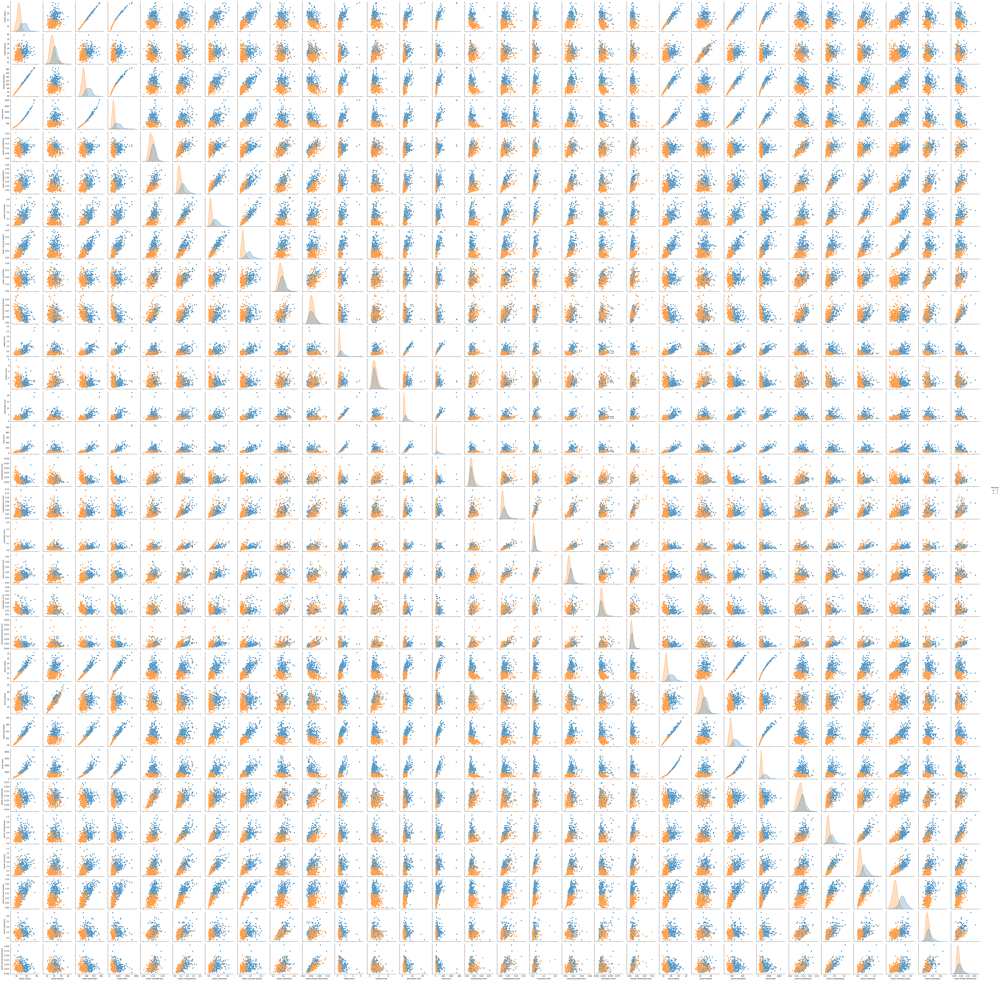

In [33]:
sns.pairplot(df, hue='infected')

Based on the dataset, it can be seen that there is a clear distinct based on most of features.

In [294]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,infected
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


# Data Preprocessing

## Train test Split

In [295]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

## Scaling the Dataset

In [296]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Grid Search, Model & Parameters

In [297]:
f1_score = make_scorer(fbeta_score, beta=1, average='micro')


def Grid_Search(model, paramaters, X, y):
    model = GridSearchCV(estimator=model, 
                 param_grid=paramaters, 
                 cv=3,
                scoring=f1_score
                )
    
    return model.fit(X, y)

In [298]:
svc_clf = SVC()
dtree = DecisionTreeClassifier()
GNB = GaussianNB()
SGD = SGDClassifier() 
LR = LogisticRegression()
KNb = KNeighborsClassifier()
xgbb = xgb.XGBClassifier(eval_metric='mlogloss')

svcparams = {'degree':[1,2,3, 10], 'C':[1,10] }
dtreeparams = {'max_depth':[1,2,3] }
SGDparams = {'l1_ratio':[0.1,0.15,0.2,0.5] }
LRparams = {'l1_ratio':[0.1,0.15,0.2,0.5, 0.6,0.7, 0.8, 1] }
KNbparams = {'n_neighbors':[1,2,3,4,5] }
xgbparams = {'max_depth': [2,4,6],
                    'n_estimators': [50,100,200]}

algorithm = []
scores = []

list_of_algorithms = [(svc_clf,svcparams, 'SVC'), ( dtree, dtreeparams, 'dtree') ,
                      (SGD,SGDparams, 'SGD'), (LR, LRparams, 'LR'), (KNb, KNbparams, 'K Nearest Neighbors'),(xgbb, xgbparams, 'XGB') ]

# Fitting Model (Without PCA)

In [299]:
for (model, parameters, name_of_algorithms) in list_of_algorithms:
    models = Grid_Search(model, parameters, X_train, y_train.values.flatten())
    scores.append(pd.DataFrame(models.cv_results_)['mean_test_score'].max())
    algorithm.append(name_of_algorithms)
Performance_test_dataset = pd.DataFrame(scores,algorithm, columns=['F1 Score Performance'])

### Algorithm Evaluation & Selection

In [300]:
Performance_test_dataset['F1 Score Performance'].sort_values(ascending=False)

SVC                    0.971831
LR                     0.971831
XGB                    0.964789
K Nearest Neighbors    0.962441
SGD                    0.960094
dtree                  0.917840
Name: F1 Score Performance, dtype: float64

Text(0.5, 1.0, 'Different Algorithm Performance (Without PCA)')

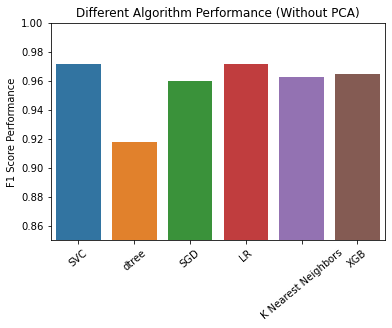

In [301]:
sns.barplot(Performance_test_dataset.index, Performance_test_dataset['F1 Score Performance'])
plt.ylim(0.85, 1)
plt.xticks(rotation=40)
plt.title('Different Algorithm Performance (Without PCA)')

SVC & Logistic Regression has the best performance without the PCA. A test score of 97.18% was attained with SVC. Thus I selected SVC.

In [302]:
selected_model = Grid_Search(svc_clf, svcparams, X_train, y_train.values.flatten())

### Classification Report

In [303]:
print(classification_report(y_train,selected_model.predict(X_train)))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98       158
           1       0.98      1.00      0.99       268

    accuracy                           0.99       426
   macro avg       0.99      0.98      0.99       426
weighted avg       0.99      0.99      0.99       426



### Confusion Matrix On Train Set

In [304]:
cm = confusion_matrix(y_train,selected_model.predict(X_train))

[Text(0, 0.5, 'Actual 0s'), Text(0, 1.5, 'Actual 1s')]

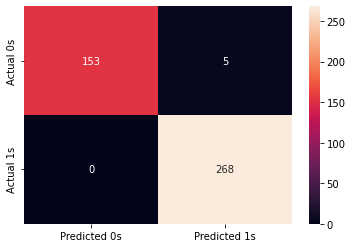

In [305]:
g = sns.heatmap(cm, annot=True , fmt='g')
g.get_xaxis().set_label_coords(-0.2,0.5)
g.get_yaxis().set_label_coords(-0.2,0.5)
g.set_xticklabels(['Predicted 0s', 'Predicted 1s'], ha='center')
g.set_yticklabels(['Actual 0s', 'Actual 1s'], va='center')

### Confusion Matrix On Test Set

In [306]:
cm2 = confusion_matrix(y_test,selected_model.predict(X_test))

[Text(0, 0.5, 'Actual 0s'), Text(0, 1.5, 'Actual 1s')]

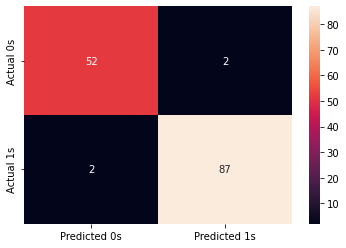

In [307]:
g = sns.heatmap(cm2, annot=True , fmt='g')
g.get_xaxis().set_label_coords(-0.2,0.5)
g.get_yaxis().set_label_coords(-0.2,0.5)
g.set_xticklabels(['Predicted 0s', 'Predicted 1s'], ha='center')
g.set_yticklabels(['Actual 0s', 'Actual 1s'], va='center')

In [308]:
f1_score(X= X_test, y_true = y_test, estimator =selected_model)

0.972027972027972

In [309]:
print(classification_report(y_test,selected_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        54
           1       0.98      0.98      0.98        89

    accuracy                           0.97       143
   macro avg       0.97      0.97      0.97       143
weighted avg       0.97      0.97      0.97       143



# Model Selection Using PCA

### Train Test Split 

In [310]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

### Scaling the dataset

In [311]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Optimal PCA Analysis & Selection

In [312]:
EVR = []
for i in range(len(X.columns)):
    PCA_model = PCA(n_components=i)
    pca_x = PCA_model.fit_transform(X_train)
    EVR.append(PCA_model.explained_variance_ratio_.sum())

In [313]:
screeplot = pd.DataFrame(range(len(X.columns)), EVR)

Text(0.5, 1.0, 'Screeplot showing PCA performance')

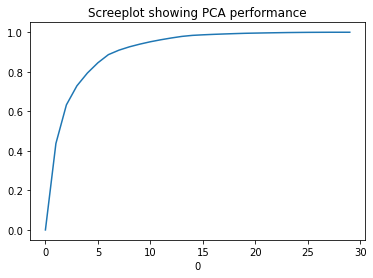

In [314]:
sns.lineplot( screeplot[0], screeplot.index)
plt.title('Screeplot showing PCA performance')

After viewing the screeplot it could be seen that around 6 dimensions is the optimal dimension. At this point the an additional dimension doesnt add more variance to the dataset

In [315]:
PCA_model = PCA(n_components=6)
pca_x = PCA_model.fit_transform(X_train)
pca_x_test=PCA_model.fit_transform(X_test)

In [316]:
train_df = pd.concat([pd.DataFrame(pca_x), y_train.reset_index()], axis=1).drop(columns=['index'])

Text(0.5, 1.01, 'Different Dimensions of PCA (6 Dimensions)')

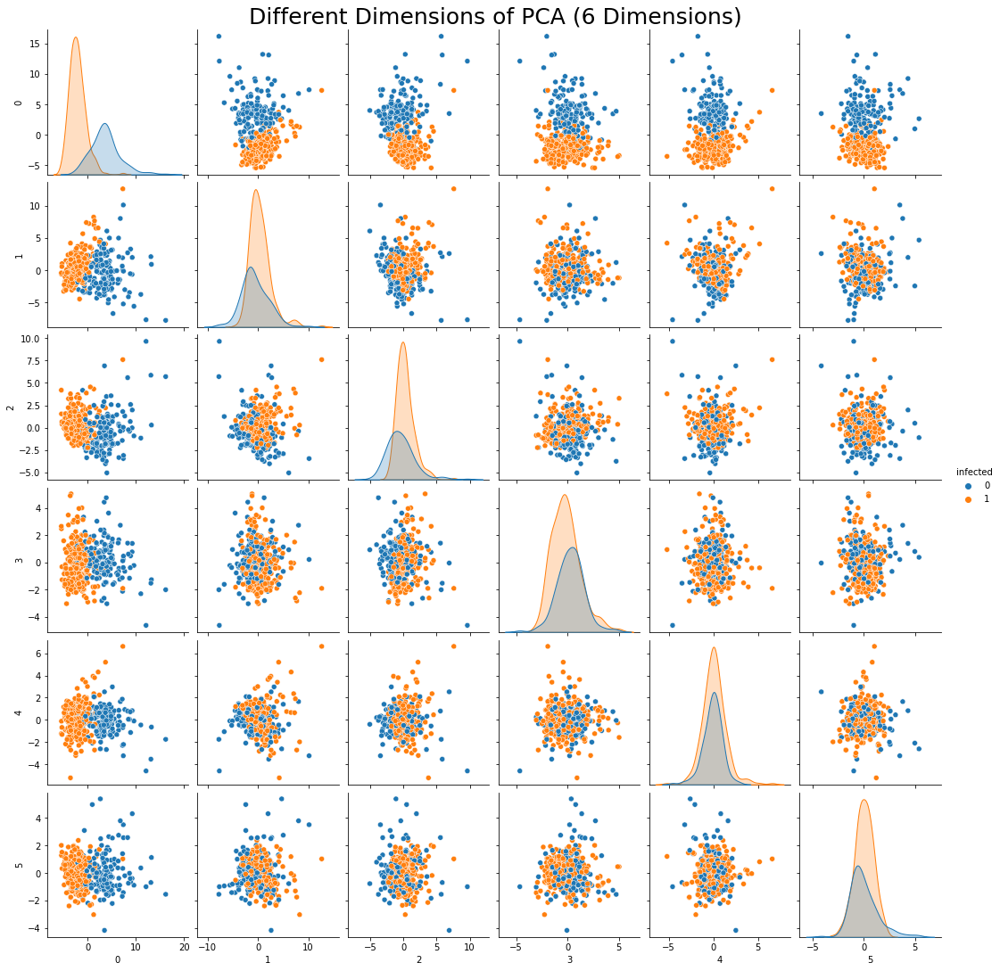

In [317]:
g = sns.pairplot(train_df, hue='infected')

g.fig.suptitle('Different Dimensions of PCA (6 Dimensions)', y=1.01, size=25)

### Fitting Model

In [318]:
algorithm = []
scores = []
for (model, parameters, name_of_algorithms) in list_of_algorithms:
    models = Grid_Search(model, parameters, pca_x, y_train.values.flatten())
    scores.append(pd.DataFrame(models.cv_results_)['mean_test_score'].max())
    algorithm.append(name_of_algorithms)
Performance_test_dataset = pd.DataFrame(scores,algorithm, columns=['F1 Score Performance'])

In [319]:
Performance_test_dataset['F1 Score Performance'].sort_values(ascending=False)

SVC                    0.967136
SGD                    0.964789
LR                     0.964789
K Nearest Neighbors    0.962441
XGB                    0.950704
dtree                  0.910798
Name: F1 Score Performance, dtype: float64

Once again SVC is seen as the model with the best performance.

Text(0.5, 1.0, 'Different Algorithm Performance (With PCA)')

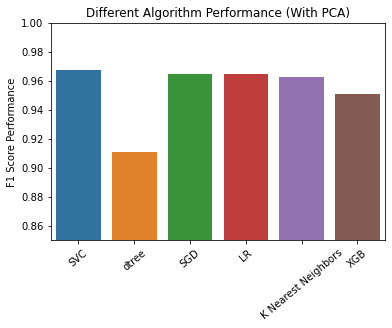

In [320]:
sns.barplot(Performance_test_dataset.index, Performance_test_dataset['F1 Score Performance'])
plt.ylim(0.85, 1)
plt.xticks(rotation=40)
plt.title('Different Algorithm Performance (With PCA)')

In [321]:
selected_model = Grid_Search(svc_clf, svcparams, pca_x, y_train.values.flatten())

### Confusion Matrix On the Train Set (with PCA)

In [322]:
cm = confusion_matrix(y_train,selected_model.predict(pca_x))

[Text(0, 0.5, 'Actual 0s'), Text(0, 1.5, 'Actual 1s')]

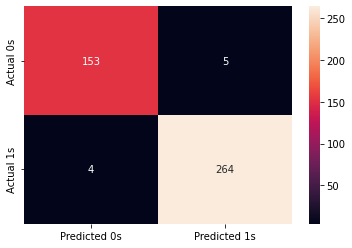

In [323]:
g = sns.heatmap(cm, annot=True , fmt='g')
g.get_xaxis().set_label_coords(-0.2,0.5)
g.get_yaxis().set_label_coords(-0.2,0.5)
g.set_xticklabels(['Predicted 0s', 'Predicted 1s'], ha='center')
g.set_yticklabels(['Actual 0s', 'Actual 1s'], va='center')

In [324]:
print(classification_report(y_train,selected_model.predict(pca_x)))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       158
           1       0.98      0.99      0.98       268

    accuracy                           0.98       426
   macro avg       0.98      0.98      0.98       426
weighted avg       0.98      0.98      0.98       426



SVC Performance On Training Set

As this is cancer prediction Recall is more important than Precision. Therefore its important to less False Negatives for Class 1.

The **class 0** has a **precision, recall and f1-score** of **0.97**.

The **class 1** has **precision** & **f1-score** of **0.98** & **recall** of **0.99**.

### Confusion Matrix On test Set (with PCA)

[Text(0, 0.5, 'Actual 0s'), Text(0, 1.5, 'Actual 1s')]

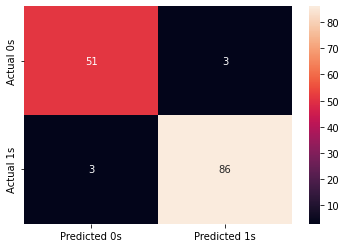

In [325]:
cm2 = confusion_matrix(y_test,selected_model.predict(pca_x_test))
g = sns.heatmap(cm2, annot=True , fmt='g')
g.get_xaxis().set_label_coords(-0.2,0.5)
g.get_yaxis().set_label_coords(-0.2,0.5)
g.set_xticklabels(['Predicted 0s', 'Predicted 1s'], ha='center')
g.set_yticklabels(['Actual 0s', 'Actual 1s'], va='center')

In [326]:
print(classification_report(y_test,selected_model.predict(pca_x_test)))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94        54
           1       0.97      0.97      0.97        89

    accuracy                           0.96       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.96      0.96      0.96       143



SVC Performance On Test Set

The **class 0** has a **precision, recall and f1-score** of **0.94**.

The **class 1** has a **precision, recall and f1-score** of **0.97**.

# Conclusion

#### Different Model For Different use Case
- If the dataset is small dataset (For a small hospital) then the model without PCA would be adopted.The model particularly has a 100% recall performance and the precision performance is high enough on the Class 1 which is perfect for the use Medical use case 

- If the dataset is huge (for a large hospital) then for computation sakes of the model, then the model with PCA would be perfect.